In [2]:
import torchvision
from torchvision.models.detection.ssd import SSDHead
from torchvision.models.detection import _utils as det_utils
import torch 
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms

if(torch.cuda.is_available()):
    device = torch.device("cuda")
    print("Device:", device, torch.cuda.get_device_name(0))
else:
    device= torch.device("cpu")
    print("Device:", device)

Device: cuda Tesla P100-PCIE-16GB


In [17]:
def create_ssd_model(num_classes, size=300):
    model = torchvision.models.detection.ssd300_vgg16(weights='DEFAULT')
    
    in_channels = det_utils.retrieve_out_channels(model.backbone, (size, size))
    num_anchors = model.anchor_generator.num_anchors_per_location()
    
    model.head.classification_head = SSDHead(in_channels, num_anchors, num_classes)
    
    # Ensure the model is in evaluation mode
    model.eval()
    
    return model



# Create the model
num_classes = 12
ssd_model = create_ssd_model(num_classes)
ssd_model = ssd_model.to(device)

In [15]:
import glob
import json
class SelfDrivingCarDataset(torch.utils.data.Dataset):  
    def __init__(self, images_path, std=False):
        super(SelfDrivingCarDataset, self).__init__()
        self.images_path = glob.glob(images_path + "/*.jpg")
        self.std = std
        with open(images_path + '_annotations.coco.json', 'r') as f:
            self.annotations = json.load(f)
        
    def __len__(self):
        return len(self.images_path)  

    def __getitem__(self, idx):
        file_path = self.images_path[idx]
        file_name = file_path.split("/")[-1]  # Get the actual filename
        img_id = None

        # Find the image ID corresponding to the filename
        for img_info in self.annotations['images']:
            if img_info['file_name'] == file_name:
                img_id = img_info['id']
                break

        if img_id is None:
            print(f"No image ID found for file: {file_name}")
            return None, None

        # Collect annotations for the image
        bbox, areas, iscrowd, labels = [], [], [], []
        for box in self.annotations['annotations']:
            if box['image_id'] == img_id:
                bbox.append(box['bbox'])
                areas.append(box['area'])
                iscrowd.append(box['iscrowd'])
                labels.append(box['category_id'])
        
        # Read and process the image
        img = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        
        # Convert bounding boxes from [x, y, w, h] to [x_min, y_min, x_max, y_max]
        if len(bbox) > 0:
            bbox = np.array(bbox)
            bbox[:, 2] = bbox[:, 0] + bbox[:, 2]
            bbox[:, 3] = bbox[:, 1] + bbox[:, 3]
            bbox = torch.as_tensor(bbox, dtype=torch.float32)
        else:
            bbox = torch.zeros((0, 4), dtype=torch.float32)
        
        if self.std:
            img = img / 255.0  # Normalize to [0, 1]

        


        # Prepare target dictionary
        target = {}
        target["boxes"] = bbox
        target["labels"] = torch.tensor(labels, dtype=torch.int64)
        target["area"] = torch.as_tensor(areas, dtype=torch.float32)
        target["iscrowd"] = torch.tensor(iscrowd, dtype=torch.int64)
        target["image_id"] = torch.tensor([idx])

        # Convert image to torch tensor
        img = torch.from_numpy(img).permute(2, 0, 1)  # [H, W, C] -> [C, H, W]

        # Convert image to tensor if it's not already
        if not isinstance(img, torch.Tensor):
            img = ToTensor()(img)

        return img, target

In [11]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
val_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
test_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)

# Split the dataset
indices = torch.randperm(len(train_dataset)).tolist()
train_dataset = torch.utils.data.Subset(train_dataset, indices[:18800])
val_dataset = torch.utils.data.Subset(val_dataset, indices[18800:23800])
test_dataset = torch.utils.data.Subset(test_dataset, indices[23800:])

# DataLoaders
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=16, shuffle=True, num_workers=4,
    collate_fn=collate_fn)

val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=16, shuffle=False, num_workers=4,
    collate_fn=collate_fn)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=1, shuffle=False, num_workers=4,
    collate_fn=collate_fn)

In [18]:
from tqdm import tqdm
import cv2
import numpy  as np

# Optimizer
params = [p for p in ssd_model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.0001)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# Training loop
num_epochs = 2
for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    ssd_model.train()
    train_loss = 0.0
    
    for images, targets in tqdm(train_dataloader):

        print("Image type:", type(images[0]))
        print("Image shape:", images[0].shape)
        print("Target keys:", targets[0].keys())
        print("Target types:", {k: type(v) for k, v in targets[0].items()})
        break
    #     images = list(image.to(device) for image in images)
    #     targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
    #     loss_dict = ssd_model(images, targets)
    #     losses = sum(loss for loss in loss_dict.values())

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        print("Image type after moving to device:", type(images[0]))
        print("Image shape after moving to device:", images[0].shape)
        print("Target keys after moving to device:", targets[0].keys())
        print("Target types after moving to device:", {k: type(v) for k, v in targets[0].items()})
        
        try:
            loss_dict = ssd_model(images, targets)
        except Exception as e:
            print("Error occurred:")
            print(e)
            print("Model state:", ssd_model.training)
            break

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        
        train_loss += losses.item()
    
    # Validation
    ssd_model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, targets in val_dataloader:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            loss_dict = ssd_model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            val_loss += losses.item()
    
    print(f"Train loss: {train_loss / len(train_dataloader):.4f}")
    print(f"Validation loss: {val_loss / len(val_dataloader):.4f}")
    
    lr_scheduler.step()

print("Training complete!")


Epoch 1/2


  0%|          | 0/1175 [00:02<?, ?it/s]

Image type: <class 'torch.Tensor'>
Image shape: torch.Size([3, 512, 512])
Target keys: dict_keys(['boxes', 'labels', 'area', 'iscrowd', 'image_id'])
Target types: {'boxes': <class 'torch.Tensor'>, 'labels': <class 'torch.Tensor'>, 'area': <class 'torch.Tensor'>, 'iscrowd': <class 'torch.Tensor'>, 'image_id': <class 'torch.Tensor'>}


AttributeError: 'dict' object has no attribute 'softmax'

In [5]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [17]:
import torch
import torchvision
from torchvision.models.detection import ssd300_vgg16
from torchvision.models.detection.ssd import SSDHead
import torchvision.transforms as T
import glob
import json
import numpy as np

# 1. First, let's modify the dataset class to ensure correct formatting
class SelfDrivingCarDataset(torch.utils.data.Dataset):
    def __init__(self, images_path, std=False):
        super(SelfDrivingCarDataset, self).__init__()
        self.images_path = glob.glob(images_path + "/*.jpg")
        self.std = std
        with open(images_path + '_annotations.coco.json', 'r') as f:
            self.annotations = json.load(f)
        
        # Add transforms
        self.transforms = T.Compose([
            T.ToTensor(),
            T.Resize((300, 300))  # SSD300 requires 300x300 images
        ])
    
    def __len__(self):
        return len(self.images_path)

    from PIL import Image  # Add this import

    def __getitem__(self, idx):
        file_path = self.images_path[idx]
        file_name = file_path.split("/")[-1]
        
        # Find image ID
        img_id = None
        for img_info in self.annotations['images']:
            if img_info['file_name'] == file_name:
                img_id = img_info['id']
                break
    
        if img_id is None:
            print(f"No image ID found for file: {file_name}")
            return None, None
    
        # Collect annotations
        bbox, labels = [], []
        for box in self.annotations['annotations']:
            if box['image_id'] == img_id:
                bbox.append(box['bbox'])
                labels.append(box['category_id'])
        
        # Read and process image
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Convert the NumPy array to a PIL Image
        img = Image.fromarray(img)
        
        # Apply transforms
        img = self.transforms(img)
        
        # Convert boxes from [x, y, w, h] to [x_min, y_min, x_max, y_max]
        if len(bbox) > 0:
            bbox = torch.tensor(bbox, dtype=torch.float32)
            bbox[:, 2] = bbox[:, 0] + bbox[:, 2]
            bbox[:, 3] = bbox[:, 1] + bbox[:, 3]
        else:
            bbox = torch.zeros((0, 4), dtype=torch.float32)
        
        # Prepare target dictionary
        target = {}
        target["boxes"] = bbox
        target["labels"] = torch.tensor(labels, dtype=torch.int64)
        target["image_id"] = torch.tensor([idx])
        target["area"] = (bbox[:, 2] - bbox[:, 0]) * (bbox[:, 3] - bbox[:, 1])
        target["iscrowd"] = torch.zeros((len(bbox),), dtype=torch.int64)
    
        return img, target


# 2. Create the SSD model
import torch
import torchvision

import torch
from tqdm import tqdm
import torchvision

def create_ssd_model(num_classes, size=300, pretrained=True):
    # Load the model with appropriate weights
    weights = (
        torchvision.models.detection.SSD300_VGG16_Weights.COCO_V1 if pretrained else None
    )
    model = torchvision.models.detection.ssd300_vgg16(weights=weights)

    # Extract the number of input channels for all feature maps
    feature_extractor = model.backbone
    dummy_input = torch.randn(1, 3, size, size)  # Simulating an input image
    features = feature_extractor(dummy_input)  # Forward pass through the backbone
    in_channels = [feat.shape[1] for feat in features.values()]  # Get channels for all feature maps

    # Get the number of anchors per feature map
    num_anchors = model.anchor_generator.num_anchors_per_location()

    # Replace the classification head
    model.head.classification_head = torchvision.models.detection.ssd.SSDClassificationHead(
        in_channels=in_channels,
        num_anchors=num_anchors,
        num_classes=num_classes
    )
    
    # Reinitialize classification head weights
    def initialize_weights(layer):
        for m in layer.modules():
            if isinstance(m, torch.nn.Conv2d):
                torch.nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    torch.nn.init.zeros_(m.bias)
    
    initialize_weights(model.head.classification_head)

    # Update transform sizes
    model.transform.min_size = (size,)
    model.transform.max_size = size
    
    return model


import cv2

# 3. Setup training
# 3. Setup training
# 3. Setup training
# 3. Setup training
# 3. Setup training
def warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor):
    """
    Returns a learning rate scheduler for warm-up.
    """
    def lr_lambda(epoch):
        if epoch >= warmup_iters:
            return 1
        alpha = float(epoch) / warmup_iters
        return warmup_factor * (1 - alpha) + alpha

    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)


def train_ssd():
    # Create datasets and dataloaders
    train_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
    val_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)

    # Split datasets
    indices = torch.randperm(len(train_dataset)).tolist()
    train_dataset = torch.utils.data.Subset(train_dataset, indices[:18800])
    val_dataset = torch.utils.data.Subset(val_dataset, indices[18800:23800])

    train_dataloader = torch.utils.data.DataLoader(
        train_dataset, batch_size=8, shuffle=True,
        collate_fn=collate_fn, num_workers=4
    )

    val_dataloader = torch.utils.data.DataLoader(
        val_dataset, batch_size=8, shuffle=False,
        collate_fn=collate_fn, num_workers=4
    )

    # Create model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = create_ssd_model(num_classes=12)
    model.to(device)

    # Create optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.AdamW(params, lr=0.0001, weight_decay=0.0005)

    # Warm-up scheduler
    warmup_scheduler = warmup_lr_scheduler(optimizer, warmup_iters=500, warmup_factor=1.0 / 3.0)

    # Cosine Annealing after warm-up
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)

    # Training loop
    num_epochs = 10
    warmup_epochs = 3
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for images, targets in tqdm(train_dataloader):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Forward pass
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            # Backward pass
            optimizer.zero_grad()
            losses.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10)  # Gradient clipping
            optimizer.step()

            total_loss += losses.item()

        # Print epoch results
        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss: {avg_loss:.4f}")

        # Step warmup or main scheduler
        if epoch < warmup_epochs:
            warmup_scheduler.step()
        else:
            lr_scheduler.step()

        # Evaluate on validation set
        evaluate(model, val_dataloader, device)

    return model

# 4. Train the model
if __name__ == "__main__":
    model = train_ssd()



  0%|          | 0/2350 [00:00<?, ?it/s]


NameError: Caught NameError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/_utils/worker.py", line 309, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/_utils/fetch.py", line 50, in fetch
    data = self.dataset.__getitems__(possibly_batched_index)
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataset.py", line 420, in __getitems__
    return [self.dataset[self.indices[idx]] for idx in indices]
  File "/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataset.py", line 420, in <listcomp>
    return [self.dataset[self.indices[idx]] for idx in indices]
  File "/tmp/ipykernel_24/819411349.py", line 57, in __getitem__
    img = Image.fromarray(img)
NameError: name 'Image' is not defined


In [18]:
import torch
import torchvision
from torchvision.models.detection import ssd300_vgg16
from torchvision.models.detection.ssd import SSDHead
import torchvision.transforms as T

# 1. First, let's modify the dataset class to ensure correct formatting
class SelfDrivingCarDataset(torch.utils.data.Dataset):
    def __init__(self, images_path, std=False):
        super(SelfDrivingCarDataset, self).__init__()
        self.images_path = glob.glob(images_path + "/*.jpg")
        self.std = std
        with open(images_path + '_annotations.coco.json', 'r') as f:
            self.annotations = json.load(f)
        
        # Add transforms
        self.transforms = T.Compose([
            T.ToTensor(),
            T.Resize((300, 300))  # SSD300 requires 300x300 images
        ])
    
    def __len__(self):
        return len(self.images_path)

    def __getitem__(self, idx):
        file_path = self.images_path[idx]
        file_name = file_path.split("/")[-1]
        
        # Find image ID
        img_id = None
        for img_info in self.annotations['images']:
            if img_info['file_name'] == file_name:
                img_id = img_info['id']
                break

        if img_id is None:
            print(f"No image ID found for file: {file_name}")
            return None, None

        # Collect annotations
        bbox, labels = [], []
        for box in self.annotations['annotations']:
            if box['image_id'] == img_id:
                bbox.append(box['bbox'])
                labels.append(box['category_id'])
        
        # Read and process image
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Apply transforms
        img = self.transforms(img)
        
        # Convert boxes from [x, y, w, h] to [x_min, y_min, x_max, y_max]
        if len(bbox) > 0:
            bbox = torch.tensor(bbox, dtype=torch.float32)
            bbox[:, 2] = bbox[:, 0] + bbox[:, 2]
            bbox[:, 3] = bbox[:, 1] + bbox[:, 3]
        else:
            bbox = torch.zeros((0, 4), dtype=torch.float32)
        
        # Prepare target dictionary
        target = {}
        target["boxes"] = bbox
        target["labels"] = torch.tensor(labels, dtype=torch.int64)
        target["image_id"] = torch.tensor([idx])
        target["area"] = (bbox[:, 2] - bbox[:, 0]) * (bbox[:, 3] - bbox[:, 1])
        target["iscrowd"] = torch.zeros((len(bbox),), dtype=torch.int64)

        return img, target

# 2. Create the SSD model
def create_ssd_model(num_classes, size=300):
    # Load the model with proper weights
    model = torchvision.models.detection.ssd300_vgg16(
        weights=torchvision.models.detection.SSD300_VGG16_Weights.COCO_V1
    )
    
    # Get input channels using the utility function
    in_channels = torchvision.models.detection._utils.retrieve_out_channels(
        model.backbone, 
        (size, size)
    )
    
    # Get number of anchors
    num_anchors = model.anchor_generator.num_anchors_per_location()
    
    # Modify the classification head
    model.head.classification_head = torchvision.models.detection.ssd.SSDClassificationHead(
        in_channels=in_channels,
        num_anchors=num_anchors,
        num_classes=num_classes
    )
    
    # Update transform size
    model.transform.min_size = (size,)
    model.transform.max_size = size
    
    return model


# 3. Setup training
# 3. Setup training
def train_ssd():
    # Create datasets and dataloaders
    train_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
    val_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)

    # Split datasets
    indices = torch.randperm(len(train_dataset)).tolist()
    train_dataset = torch.utils.data.Subset(train_dataset, indices[:18800])
    val_dataset = torch.utils.data.Subset(val_dataset, indices[18800:23800])

    train_dataloader = torch.utils.data.DataLoader(
        train_dataset, batch_size=16, shuffle=True,
        collate_fn=collate_fn, num_workers=4
    )

    val_dataloader = torch.utils.data.DataLoader(
        val_dataset, batch_size=16, shuffle=False,
        collate_fn=collate_fn, num_workers=4
    )

    # Create model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = create_ssd_model(num_classes=12, pretrained=True)
    model.to(device)

    # Create optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.0005)

    # Cyclical LR Scheduler
    lr_scheduler = torch.optim.lr_scheduler.CyclicLR(
        optimizer, base_lr=1e-5, max_lr=1e-2, step_size_up=2000, mode='triangular2'
    )

    # Training loop
    num_epochs = 10
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for images, targets in tqdm(train_dataloader):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Forward pass
            loss_dict = model(images, targets)
            cls_loss = loss_dict['classification']
            loc_loss = loss_dict['bbox_regression']

            # Weighted loss combination
            total_batch_loss = 0.8 * cls_loss + 1.2 * loc_loss

            # Backward pass
            optimizer.zero_grad()
            total_batch_loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10)  # Gradient clipping
            optimizer.step()

            total_loss += total_batch_loss.item()

        # Print epoch results
        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss: {avg_loss:.4f}")

        # Update learning rate
        lr_scheduler.step()

    return model

# 4. Train the model
if __name__ == "__main__":
    model = train_ssd()

TypeError: create_ssd_model() got an unexpected keyword argument 'pretrained'

In [25]:
model

SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [114]:
model

SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [26]:
def retrieve_test_predictions(model, test_dataloader, device, threshold=0.5):
    model.eval()
    predictions = []
    ground_truths = []

    with torch.no_grad():
        for images, targets in test_dataloader:
            images = list(img.to(device) for img in images)
            outputs = model(images)

            for i, output in enumerate(outputs):
                boxes = output["boxes"].cpu().numpy()
                scores = output["scores"].cpu().numpy()
                labels = output["labels"].cpu().numpy()

                # Apply threshold
                mask = scores >= threshold
                filtered_boxes = boxes[mask]
                filtered_scores = scores[mask]
                filtered_labels = labels[mask]

                predictions.append({
                    "boxes": filtered_boxes,
                    "scores": filtered_scores,
                    "labels": filtered_labels
                })
                ground_truths.append({
                    "boxes": targets[i]["boxes"].cpu().numpy(),
                    "labels": targets[i]["labels"].cpu().numpy()
                })

    return predictions, ground_truths

# Use the function
test_predictions, test_ground_truths = retrieve_test_predictions(model, test_dataloader, device, threshold=0.5)

# Example: Access predictions for the first test image
print("Predictions for first test image:")
print("Boxes:", test_predictions[0]["boxes"])
print("Scores:", test_predictions[0]["scores"])
print("Labels:", test_predictions[0]["labels"])

print("\nGround Truth for first test image:")
print("Boxes:", test_ground_truths[0]["boxes"])
print("Labels:", test_ground_truths[0]["labels"])


Predictions for first test image:
Boxes: [[345.78815 367.79346 512.      512.     ]
 [122.21941 333.3592  238.52734 512.     ]
 [ 32.22784 470.92752 111.4939  512.     ]]
Scores: [0.9866976 0.969686  0.7185457]
Labels: [ 2 11  2]

Ground Truth for first test image:
Boxes: [[ 16.  278.   67.5 306. ]
 [ 63.  195.  135.5 313.5]
 [149.  262.  171.5 287.5]
 [184.  227.  334.  398.5]
 [189.  260.  203.  278. ]
 [226.  211.  232.  229. ]
 [369.  236.  380.5 288. ]
 [370.  237.  381.  284. ]]
Labels: [ 2 11  2  2  2  7  3  3]


In [182]:
def calculate_iou(box1, box2):
    """
    Calculate IoU (Intersection over Union) for two bounding boxes.

    Args:
        box1 (array): [x1, y1, x2, y2] for the first box.
        box2 (array): [x1, y1, x2, y2] for the second box.

    Returns:
        float: IoU value (0.0 to 1.0).
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Compute the area of intersection
    intersection = max(0, x2 - x1) * max(0, y2 - y1)

    # Compute the area of both boxes
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the union area
    union = box1_area + box2_area - intersection

    if union == 0:
        return 0.0

    return intersection / union

In [183]:
def calculate_mean_iou(test_predictions, test_ground_truths):
    all_ious = []
    
    for pred_sample, gt_sample in zip(test_predictions, test_ground_truths):
        pred_boxes = pred_sample['boxes']
        pred_scores = pred_sample['scores']
        gt_boxes = gt_sample['boxes']
        
        if pred_boxes.size==0:  # Skip if no predictions
            continue
            
        # Sort predictions by confidence score
        pred_boxes_with_scores = sorted(zip(pred_boxes, pred_scores), 
                                      key=lambda x: x[1], 
                                      reverse=True)
        pred_boxes = [box for box, _ in pred_boxes_with_scores]
        
        # Calculate best IoU for each ground truth box
        for gt_box in gt_boxes:
            ious = [calculate_iou(gt_box, pred_box) for pred_box in pred_boxes]
            if ious:
                max_iou = max(ious)
                all_ious.append(max_iou)
    
    # Calculate mean IoU
    mean_iou = sum(all_ious) / len(all_ious) if all_ious else 0.0
    return mean_iou

In [184]:
mean_iou = calculate_mean_iou(test_predictions, test_ground_truths)
mean_iou

0.005781418956055485

In [185]:
from collections import defaultdict

def calculate_mean_iou_per_class(test_predictions, test_ground_truths):
    iou_per_class = defaultdict(list)
    
    for pred_sample, gt_sample in zip(test_predictions, test_ground_truths):
        pred_boxes = pred_sample['boxes']
        pred_labels = pred_sample['labels']
        pred_scores = pred_sample['scores']
        gt_boxes = gt_sample['boxes']
        gt_labels = gt_sample['labels']
        
        # Group ground truth boxes by class
        gt_boxes_by_class = defaultdict(list)
        for gt_box, gt_label in zip(gt_boxes, gt_labels):
            gt_boxes_by_class[gt_label].append(gt_box)
            
        # Group predicted boxes by class
        pred_boxes_by_class = defaultdict(list)
        for pred_box, pred_label, pred_score in zip(pred_boxes, pred_labels, pred_scores):
            pred_boxes_by_class[pred_label].append((pred_box, pred_score))
            
        # Calculate IoU for each class
        for class_id in gt_boxes_by_class.keys():
            gt_boxes_class = gt_boxes_by_class[class_id]
            pred_boxes_class = pred_boxes_by_class[class_id]
            
            if not pred_boxes_class:  # No predictions for this class
                continue
                
            # Sort predictions by confidence score
            pred_boxes_class = sorted(pred_boxes_class, key=lambda x: x[1], reverse=True)
            pred_boxes_only = [box for box, _ in pred_boxes_class]
            
            # Calculate best IoU for each ground truth box
            for gt_box in gt_boxes_class:
                ious = [calculate_iou(gt_box, pred_box) for pred_box in pred_boxes_only]
                if ious:
                    max_iou = max(ious)
                    iou_per_class[class_id].append(max_iou)
    
    # Calculate mean IoU for each class
    mean_iou_per_class = {}
    for class_id, ious in iou_per_class.items():
        if ious:  # Only calculate mean if we have IoUs for this class
            mean_iou_per_class[class_id] = sum(ious) / len(ious)
        else:
            mean_iou_per_class[class_id] = 0.0
            
    return mean_iou_per_class

In [186]:
results = calculate_mean_iou_per_class(test_predictions, test_ground_truths)
results

{2: 0.00596541459416465,
 11: 0.018743472113476975,
 3: 0.001991760954474923,
 1: 0.0,
 7: 0.009078117929614733,
 4: 0.06008769798846472,
 5: 0.0}

In [187]:
from sklearn.metrics import average_precision_score
import numpy as np

def calculate_map(predictions, ground_truths, iou_threshold=0.5, num_classes=3):
    """
    Calculate mean Average Precision (mAP) for object detection.

    Args:
        predictions (list): List of dictionaries with predicted boxes, scores, and labels.
        ground_truths (list): List of dictionaries with ground truth boxes and labels.
        iou_threshold (float): IoU threshold for a valid prediction.
        num_classes (int): Number of classes in the dataset.

    Returns:
        float: mAP score.
    """
    ap_per_class = []

    for class_id in range(1, num_classes + 1):  # Assuming class IDs are 1-based
        true_positives = []
        scores = []
        num_gt = 0

        for pred, gt in zip(predictions, ground_truths):
            gt_boxes = gt["boxes"][gt["labels"] == class_id]
            pred_boxes = pred["boxes"][pred["labels"] == class_id]
            pred_scores = pred["scores"][pred["labels"] == class_id]

            num_gt += len(gt_boxes)
            matched_gt = set()

            # Sort predictions by scores (descending)
            sorted_indices = np.argsort(-pred_scores)
            pred_boxes = pred_boxes[sorted_indices]
            pred_scores = pred_scores[sorted_indices]

            for i, pred_box in enumerate(pred_boxes):
                best_iou = 0.0
                best_gt_idx = -1

                for gt_idx, gt_box in enumerate(gt_boxes):
                    if gt_idx in matched_gt:
                        continue
                    iou = calculate_iou(pred_box, gt_box)
                    if iou > best_iou:
                        best_iou = iou
                        best_gt_idx = gt_idx

                if best_iou >= iou_threshold and best_gt_idx not in matched_gt:
                    true_positives.append(1)
                    matched_gt.add(best_gt_idx)
                else:
                    true_positives.append(0)

                scores.append(pred_scores[i])

        # Compute precision-recall curve
        if num_gt > 0:
            true_positives = np.array(true_positives)
            scores = np.array(scores)
            indices = np.argsort(-scores)
            true_positives = true_positives[indices]
            scores = scores[indices]

            cumulative_tp = np.cumsum(true_positives)
            cumulative_fp = np.cumsum(1 - true_positives)

            precision = cumulative_tp / (cumulative_tp + cumulative_fp)
            recall = cumulative_tp / num_gt

            # Compute Average Precision (AP) for this class
            ap = np.trapz(precision, recall)
            ap_per_class.append(ap)

    # Return mean Average Precision
    return np.mean(ap_per_class)


In [188]:
# Calculate mAP
mean_ap = calculate_map(test_predictions, test_ground_truths, iou_threshold=0.5, num_classes=12)
print(f"mAP: {mean_ap:.4f}")

mAP: 0.0000


In [189]:
from collections import defaultdict
import numpy as np
from tqdm import tqdm

def calculate_iou(box1, box2):
    """
    Calculate the Intersection over Union (IoU) of two boxes.
    Each box is defined as [x1, y1, x2, y2].
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area > 0 else 0

def calculate_ap(pred_boxes, pred_scores, pred_labels, gt_boxes, gt_labels, iou_threshold=0.5):
    """
    Calculate Average Precision (AP) for a single class.
    """
    sorted_indices = np.argsort(-pred_scores)  # Sort by score descending
    pred_boxes = pred_boxes[sorted_indices]
    pred_labels = pred_labels[sorted_indices]

    tp = np.zeros(len(pred_boxes))
    fp = np.zeros(len(pred_boxes))

    matched = set()  # Track matched ground truth boxes

    for i, pred_box in enumerate(pred_boxes):
        if pred_labels[i] not in gt_labels:
            fp[i] = 1
            continue

        max_iou = 0
        max_gt_idx = -1

        for j, gt_box in enumerate(gt_boxes):
            if j in matched or gt_labels[j] != pred_labels[i]:
                continue

            iou = calculate_iou(pred_box, gt_box)
            if iou > max_iou:
                max_iou = iou
                max_gt_idx = j

        if max_iou >= iou_threshold:
            tp[i] = 1
            matched.add(max_gt_idx)
        else:
            fp[i] = 1

    # Calculate precision and recall
    tp_cumsum = np.cumsum(tp)
    fp_cumsum = np.cumsum(fp)
    precision = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-6)
    recall = tp_cumsum / len(gt_boxes)

    # Calculate AP as the area under the precision-recall curve
    ap = np.trapz(precision, recall)
    return ap

def calculate_map(test_predictions, test_ground_truth, iou_threshold=0.5):
    """
    Calculate mAP and AP for all classes.
    """
    all_detections = defaultdict(list)
    all_ground_truths = defaultdict(list)

    for pred, gt in tqdm(zip(test_predictions, test_ground_truth)):
        # Append detections
        for label, box, score in zip(pred['labels'], pred['boxes'], pred['scores']):
            all_detections[label].append((box, score))

        # Append ground truths
        for label, box in zip(gt['labels'], gt['boxes']):
            all_ground_truths[label].append(box)

    print('lists created')

    ap_per_class = {}
    for class_id in tqdm(set(all_ground_truths.keys()).union(all_detections.keys())):
        print(class_id)
        pred_boxes = np.array([d[0] for d in all_detections[class_id]])
        pred_scores = np.array([d[1] for d in all_detections[class_id]])
        pred_labels = np.full(len(pred_boxes), class_id)
        print(len(pred_labels))
        gt_boxes = np.array(all_ground_truths[class_id])
        gt_labels = np.full(len(gt_boxes), class_id)
        print(gt_labels)

        ap_per_class[class_id] = calculate_ap(
            pred_boxes, pred_scores, pred_labels, gt_boxes, gt_labels, iou_threshold
        )
        print(ap_per_class[class_id])
        print()

    # Mean Average Precision (mAP)
    mAP = np.mean(list(ap_per_class.values()))
    return mAP, ap_per_class


In [190]:
mAP, ap_per_class = calculate_map(test_predictions, test_ground_truths)

print("Mean Average Precision (mAP):", mAP)
for class_id, ap in ap_per_class.items():
    print(f"Class {class_id} AP: {ap}")

6000it [00:00, 128572.86it/s]


lists created


  9%|▉         | 1/11 [00:00<00:01,  5.19it/s]

1
30
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1

  9%|▉         | 1/11 [15:00<2:30:02, 900.26s/it]


KeyboardInterrupt: 

In [34]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Global variables to store activations and gradients
activations = None
gradients = None

# Forward hook to capture activations
def forward_hook(module, input, output):
    global activations
    activations = output

# Backward hook to capture gradients
def backward_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

# Register hooks on the desired layer for SSD
def register_hooks(model):
    # For SSD, we'll hook into the VGG backbone's last conv layer
    target_layer = model.backbone.features[-2]  # Last conv layer of VGG
    target_layer.register_forward_hook(forward_hook)
    target_layer.register_backward_hook(backward_hook)

def compute_gradcam(image, model, target_idx, device):
    global activations, gradients
    model.zero_grad()
    image = image.to(device)
    
    # SSD expects a list of images
    outputs = model([image])
    
    # Get the classification score for the target index
    score = outputs[0]['scores'][target_idx]
    score.backward()
    
    # Compute Grad-CAM
    weights = gradients.mean(dim=(2, 3), keepdim=True)
    gradcam = (weights * activations).sum(dim=1).squeeze()
    return F.relu(gradcam).cpu().detach().numpy()

def compute_saliency_map(image, model, target_idx, device):
    image = image.to(device).requires_grad_()
    model.zero_grad()
    
    # SSD expects a list of images
    outputs = model([image])
    
    # Get the classification score for the target index
    score = outputs[0]['scores'][target_idx]
    score.backward()
    
    # Compute saliency map
    saliency = image.grad.data.abs().squeeze().max(dim=0)[0]
    return saliency.cpu().numpy()

def plot_explanations(original_image_list, saliency_map_list, label_list):
    fig, axes = plt.subplots(4, 6, figsize=(20, 20))
    titles = ["Original Image", "Explanation"] * 12 
    axes = axes.flatten()

    # Prepare images and labels to plot
    images_to_plot = []
    labels_to_plot = []
    
    for i in range(len(original_image_list)):
        images_to_plot.append(original_image_list[i])
        images_to_plot.append(saliency_map_list[i])
        labels_to_plot.append(label_list[i])
        labels_to_plot.append(label_list[i])

    # Plot each image with its saliency map
    for ax, img, label, title in zip(axes, images_to_plot, labels_to_plot, titles):
        class_l = category_dict[label] if type(label) != str else 'Original'
        ax.imshow(img, cmap="jet" if title != "Original Image" else None)
        ax.set_title(f'{label}: {class_l}')
        ax.axis("off")

    plt.tight_layout()
    plt.show()

def explain_predictions_for_all_targets(model, images, zipped_list):
    saliency_maps_list = []
    label_list = []
    original_image_list = []

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()  # Important for SSD
    register_hooks(model)

    for i_label in range(1, 12):
        image, _ = images[zipped_list[i_label-1][2]]
        image_np = image.cpu().numpy().transpose(1, 2, 0)
        image_np = np.clip(image_np, 0, 1)
        image = image.to(device)
    
        # SSD expects a list of images
        with torch.no_grad():
            outputs = model([image])
        
        # Find targets for current label
        labels = outputs[0]["labels"].cpu().numpy()
        targets = list(np.where(labels == i_label)[0])
        
        if targets:  # Only proceed if we found the label
            target_idx = targets[0]
            saliency_map = compute_saliency_map(image, model, target_idx, device)
            saliency_map_resized = cv2.resize(saliency_map, (image_np.shape[1], image_np.shape[0]))
            saliency_maps_list.append(saliency_map_resized)
            label_list.append(i_label)
            original_image_list.append(image_np)

    plot_explanations(original_image_list, saliency_maps_list, label_list)

In [35]:
sorted_zipped = [(1, '1478896951217198196_jpg.rf.9239d993f82a635b6b049a02b468f79a.jpg', 5),
 (2, '1478900814278399033_jpg.rf.KeAPtrlh0ZRRk6ZiKs9Q.jpg', 0),
 (3, '1478899822519346516_jpg.rf.0CaEssvbf3X8EhzEcKYy.jpg', 1),
 (4, '1478900814278399033_jpg.rf.KeAPtrlh0ZRRk6ZiKs9Q.jpg', 0),
 (5, '1478900814278399033_jpg.rf.KeAPtrlh0ZRRk6ZiKs9Q.jpg', 0),
 (6, '1478898675369279101_jpg.rf.45446effd380efe9c27f68196331170e.jpg', 6),
 (7, '1478899822519346516_jpg.rf.0CaEssvbf3X8EhzEcKYy.jpg', 1),
 (8, '1478900133301593773_jpg.rf.c625f53c7db5c81e4c47a5fba26ce988.jpg', 7),
 (9, '1478896940362299188_jpg.rf.g5KbYm7iOwkZwHlr0VMU.jpg', 171),
 (10, '1478900373242343356_jpg.rf.f736929a171351498ab012571e1de639.jpg', 441),
 (11, '1478901375856393827_jpg.rf.1S961wwKb7FA7YyHUFQN.jpg', 2)]


In [38]:
dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
dataset_dataloader = torch.utils.data.DataLoader(
        dataset, batch_size=1, shuffle=False, num_workers=0,
        collate_fn = collate_fn)
dataset_predictions, dataset_ground_truths = retrieve_test_predictions(model, dataset_dataloader, device, threshold=0.5)

In [40]:
category_dict = {0: 'obstacles',
 1: 'biker',
 2: 'car',
 3: 'pedestrian',
 4: 'trafficLight',
 5: 'trafficLight-Green',
 6: 'trafficLight-GreenLeft',
 7: 'trafficLight-Red',
 8: 'trafficLight-RedLeft',
 9: 'trafficLight-Yellow',
 10: 'trafficLight-YellowLeft',
 11: 'truck'}

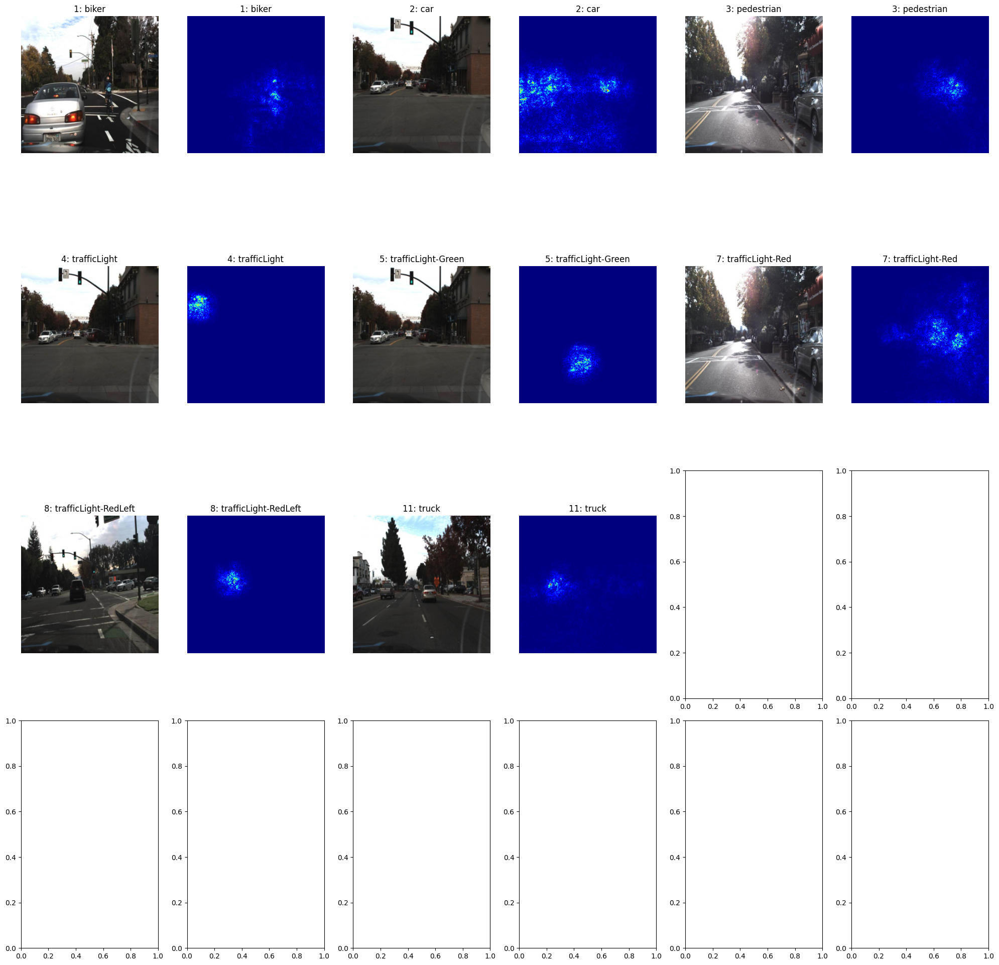

In [41]:
# Example usage
model.eval()  # Important for visualization
# image_idx = 0  # Choose an image index
explain_predictions_for_all_targets(model, dataset, sorted_zipped)

In [43]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 68.1 MB/s eta 0:00:00:00:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39588 sha256=b28ff9a225875210f230d236961e150ed2e71a73400f2dcc2bf794119c0d439a
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam


In [45]:
from pytorch_grad_cam import AblationCAM, EigenCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, scale_accross_batch_and_channels, scale_cam_image

def ssd_reshape_transform(tensor, height=300, width=300):
    """
    Reshape transform for SSD model's feature maps
    """
    result = tensor.reshape(tensor.size(0), height, width, -1)
    result = result.transpose(2, 3).transpose(1, 2)
    return result

# Create a target class for SSD
class SSDBoxScoreTarget:
    def __init__(self, labels, bounding_boxes):
        self.labels = labels
        self.bounding_boxes = bounding_boxes
        
    def __call__(self, model_output):
        if len(model_output) == 0:
            return None
        # Get the scores for the specified labels and boxes
        scores = model_output[0]['scores']
        pred_labels = model_output[0]['labels']
        pred_boxes = model_output[0]['boxes']
        
        # Match predictions with ground truth
        target_score = 0
        for gt_label, gt_box in zip(self.labels, self.bounding_boxes):
            for score, pred_label, pred_box in zip(scores, pred_labels, pred_boxes):
                if pred_label == gt_label:
                    # Calculate IoU between predicted and ground truth box
                    iou = calculate_iou(gt_box, pred_box)
                    if iou > 0.5:  # IoU threshold
                        target_score += score
        
        return target_score

def calculate_iou(box1, box2):
    """Calculate IoU between two boxes"""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    
    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    
    return intersection / (area1 + area2 - intersection)

# Visualization loop
for label, index in zip([i[0] for i in sorted_zipped], [i[2] for i in sorted_zipped]):
    # Target the last convolutional layer of the VGG backbone
    target_layers = [ssd_model.backbone.features[-2]]
    
    targets = [SSDBoxScoreTarget(labels=dataset_ground_truths[index]['labels'], 
                                bounding_boxes=dataset_ground_truths[index]['boxes'])]
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    cam = EigenCAM(
        model=ssd_model.to(device),
        target_layers=target_layers,
        reshape_transform=ssd_reshape_transform
    )
    
    input_tensor = dataset[index][0]
    input_tensor = input_tensor.unsqueeze(0).to(device)
    
    # Generate CAM
    grayscale_cam = cam(input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]
    
    # Prepare input image for visualization
    input_tensor = input_tensor.squeeze(0).cpu().detach().numpy()
    input_tensor = input_tensor.transpose(1, 2, 0)
    
    print(f'{label}:{category_dict[label]}')
    cam_image = show_cam_on_image(input_tensor, grayscale_cam, use_rgb=True)
    
    plt.imshow(cam_image)
    plt.axis('off')
    plt.show()


RuntimeError: shape '[1, 300, 300, -1]' is invalid for input of size 739328

In [49]:
!pip install pytorch-gradcam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 63.3 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-gradcam: filename=pytorch_gradcam-0.2.1-py3-none-any.whl size=5249 sha256=2ad0a4d7fc276d22e192994b73c3b20a6617fc66ca1518a56b1db41405b8f30f
  Stored in directory: /root/.cache/pip/wheels/6f/f1/8f/96c81d13f617841f23cae192a77fea3e9e988d058ba9414f2c
Successfully built pytorch-gradcam


RuntimeError: shape '[1, 300, 300, -1]' is invalid for input of size 739328

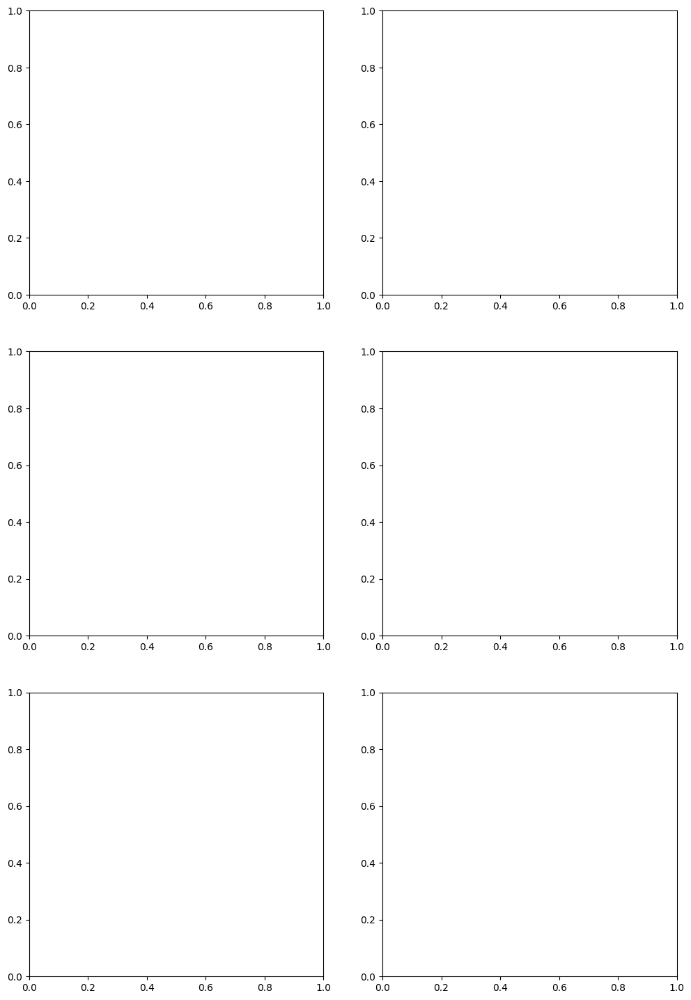

In [51]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import torch
import numpy as np
import matplotlib.pyplot as plt

# Your SSD model should already be defined and trained
# ssd_model = ...

# Define target layers - for SSD we use the last conv layer of the backbone
target_layers = [ssd_model.backbone.features[-2]]  # Using -2 as it's typically the last conv layer

def ssd_reshape_transform(tensor):
    batch_size, channels, height, width = tensor.shape
    return tensor.reshape(batch_size, height, width, channels).permute(0, 3, 1, 2)


def visualize_multiple_examples(model, dataset, indices, category_dict):
    """
    Visualize Grad-CAM for multiple images
    Args:
        model: Your SSD model
        dataset: Your dataset
        indices: List of indices to visualize
        category_dict: Dictionary mapping class IDs to names
    """
    num_images = len(indices)
    fig, axes = plt.subplots(num_images, 2, figsize=(12, 6*num_images))
    
    for idx, (ax1, ax2) in zip(indices, axes):
        image, target = dataset[idx]
        target_class = target['labels'][0].item()
        
        # Create GradCAM
        cam = GradCAM(model=model, target_layers=target_layers)
        input_tensor = image.unsqueeze(0)
        targets = [ClassifierOutputTarget(target_class)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
        
        # Prepare image for visualization
        rgb_img = image.cpu().numpy().transpose(1, 2, 0)
        rgb_img = np.clip(rgb_img, 0, 1)
        visualization = show_cam_on_image(rgb_img, grayscale_cam[0], use_rgb=True)
        
        # Plot
        ax1.imshow(rgb_img)
        ax1.set_title('Original Image')
        ax1.axis('off')
        
        ax2.imshow(visualization)
        ax2.set_title(f'Grad-CAM: {category_dict[target_class]}')
        ax2.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming you have your model, dataset, and category_dict defined
visualize_multiple_examples(ssd_model, test_dataset, [0, 5, 10], category_dict)


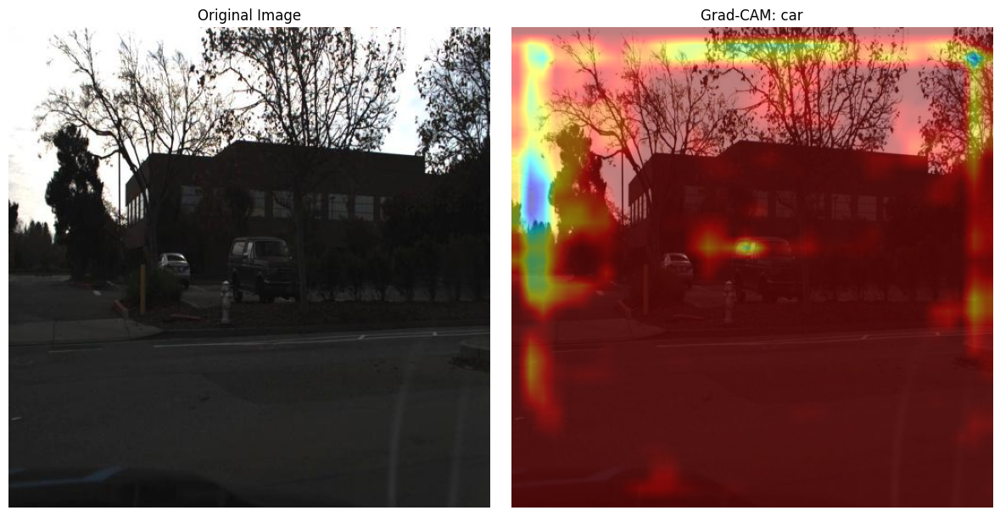

In [94]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms import Resize

# Global variables to store activations and gradients
activations = None
gradients = None

# Forward hook to capture activations
def forward_hook(module, input, output):
    global activations
    activations = output

# Backward hook to capture gradients
def backward_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

import torch
from torchvision.transforms import Resize
from torch.nn.functional import interpolate

def ssd_reshape_transform(tensor):
    # Get the actual dimensions of the feature map
    batch_size, channels, height, width = tensor.shape
    return tensor.reshape(batch_size, height, width, channels)

class ImageList:
    def __init__(self, tensors, image_sizes):
        self.tensors = tensors
        self.image_sizes = image_sizes

def visualize_gradcam(model, dataset, indices, category_dict):
    model.eval()
    
    # Register hooks
    target_layer = model.backbone.features[-2]
    target_layer.register_forward_hook(forward_hook)
    target_layer.register_backward_hook(backward_hook)
    
    for idx in indices:
        image, target = dataset[idx]
        
        # Prepare image
        device = next(model.parameters()).device
        image = image.to(device).unsqueeze(0)  # Add batch dimension
        
        # Forward pass
        outputs = model(image)
        
        # Get target class
        target_class = target['labels'][0].item()
        
        # Backward pass for Grad-CAM
        model.zero_grad()
        if len(outputs[0]['scores']) > 0:
            class_score = outputs[0]['scores'][0]
            class_score.backward()
            
            # Generate Grad-CAM
            if gradients is not None and activations is not None:
                pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
                for i in range(activations.size(1)):
                    activations[:, i, :, :] *= pooled_gradients[i]
                
                heatmap = torch.mean(activations, dim=1).squeeze().cpu().detach()
                heatmap = np.maximum(heatmap, 0)
                heatmap /= torch.max(heatmap)
                
                # Resize heatmap to match original image size
                heatmap = cv2.resize(heatmap.numpy(), (image.shape[-1], image.shape[-2]))
                
                # Create visualization
                rgb_img = image.squeeze(0).cpu().numpy().transpose(1, 2, 0)
                rgb_img = np.clip(rgb_img, 0, 1)
                
                heatmap = np.uint8(255 * heatmap)
                heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
                heatmap = np.float32(heatmap) / 255
                
                cam = heatmap + rgb_img
                cam = cam / np.max(cam)
                
                plt.figure(figsize=(12, 6))
                plt.subplot(1, 2, 1)
                plt.imshow(rgb_img)
                plt.title('Original Image')
                plt.axis('off')
                
                plt.subplot(1, 2, 2)
                plt.imshow(cam)
                plt.title(f'Grad-CAM: {category_dict[target_class]}')
                plt.axis('off')
                
                plt.tight_layout()
                plt.show()
            else:
                print("No gradients or activations captured.")
        else:
            print("No detections made by the model.")

# Example usage
visualize_gradcam(model, test_dataset, [3], category_dict)


# # Function to visualize multiple examples
# def visualize_multiple_examples(model, dataset, category_dict, num_examples=5):
#     indices = np.random.choice(len(dataset), num_examples, replace=False)
#     visualize_gradcam(model, dataset, indices, category_dict)

# # Example usage for a single image
# visualize_gradcam(ssd_model, test_dataset, [0], category_dict)

# # Example usage for multiple images
# # visualize_multiple_examples(ssd_model, test_dataset, category_dict, num_examples=5)


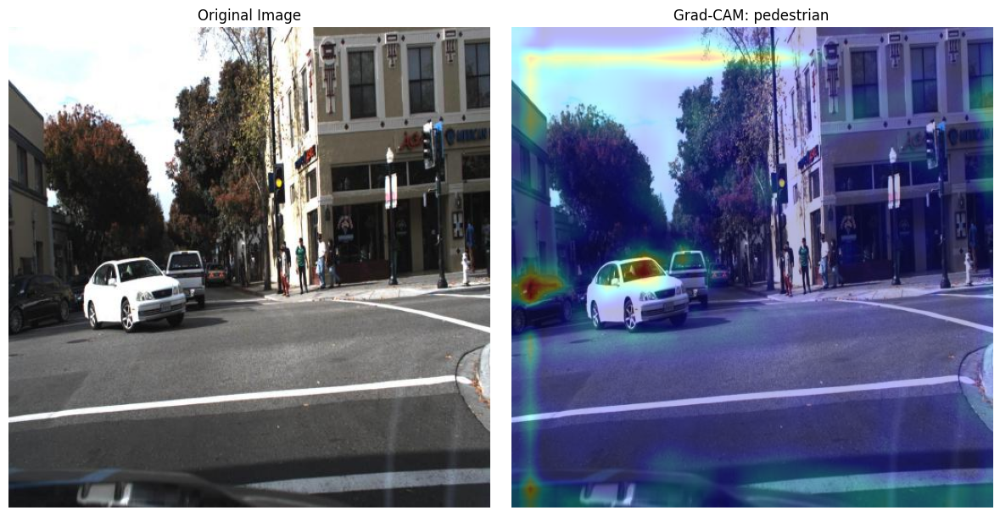

In [111]:
import cv2
import torch.nn.functional as F

# Optional: Add temperature scaling for softer/sharper visualization
# def apply_temperature_scaling(heatmap, temperature=1.0):
#     return torch.pow(heatmap, 1/temperature)



def visualize_gradcam(model, dataset, indices, category_dict):
    model.eval()
    
    # Register hooks
    target_layer = model.backbone.features[-2]
    target_layer.register_forward_hook(forward_hook)
    target_layer.register_backward_hook(backward_hook)
    
    for idx in indices:
        image, target = dataset[idx]
        
        device = next(model.parameters()).device
        image = image.to(device).unsqueeze(0)
        
        outputs = model(image)
        
        target_class = target['labels'][0].item()
        
        model.zero_grad()
        if len(outputs[0]['scores']) > 0:
            class_score = outputs[0]['scores'][0]
            class_score.backward()
            
            if gradients is not None and activations is not None:
                # Modified pooling and weighting
                pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
                weighted_activations = activations * pooled_gradients.view(1, -1, 1, 1)
                
                # Modified heatmap generation
                heatmap = torch.mean(weighted_activations, dim=1).squeeze().cpu().detach()
                heatmap = torch.relu(heatmap)  # Using ReLU instead of np.maximum
                heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-10)
                
                # Resize heatmap
                heatmap = cv2.resize(heatmap.numpy(), (image.shape[-1], image.shape[-2]))

                # In the visualize_gradcam function, add temperature scaling:
                # heatmap = apply_temperature_scaling(heatmap, temperature=1.5)
                
                # Convert image to RGB
                rgb_img = image.squeeze(0).cpu().numpy().transpose(1, 2, 0)
                rgb_img = (rgb_img - rgb_img.min()) / (rgb_img.max() - rgb_img.min())
                
                # Modified heatmap colorization
                heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
                heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB) / 255.0
                
                # Modified overlay
                alpha = 0.4  # Transparency factor
                cam = rgb_img + alpha * heatmap_colored
                cam = cam / np.max(cam)
                
                # Visualization
                plt.figure(figsize=(12, 6))
                plt.subplot(1, 2, 1)
                plt.imshow(rgb_img)
                plt.title('Original Image')
                plt.axis('off')
                
                plt.subplot(1, 2, 2)
                plt.imshow(cam)
                plt.title(f'Grad-CAM: {category_dict[target_class]}')
                plt.axis('off')
                
                plt.tight_layout()
                plt.show()

visualize_gradcam(model, test_dataset, [1], category_dict)

In [120]:
import torch
import torchvision
from torchvision.models.detection import ssd300_vgg16
from torchvision.models.detection.ssd import SSDHead
import torchvision.transforms as T

# 1. First, let's modify the dataset class to ensure correct formatting
class SelfDrivingCarDataset(torch.utils.data.Dataset):
    def __init__(self, images_path, std=False):
        super(SelfDrivingCarDataset, self).__init__()
        self.images_path = glob.glob(images_path + "/*.jpg")
        self.std = std
        with open(images_path + '_annotations.coco.json', 'r') as f:
            self.annotations = json.load(f)
        
        # Add transforms
        self.transforms = T.Compose([
            T.ToTensor(),
            T.Resize((300, 300))  # SSD300 requires 300x300 images
        ])
    
    def __len__(self):
        return len(self.images_path)

    def __getitem__(self, idx):
        file_path = self.images_path[idx]
        file_name = file_path.split("/")[-1]
        
        # Find image ID
        img_id = None
        for img_info in self.annotations['images']:
            if img_info['file_name'] == file_name:
                img_id = img_info['id']
                break

        if img_id is None:
            print(f"No image ID found for file: {file_name}")
            return None, None

        # Collect annotations
        bbox, labels = [], []
        for box in self.annotations['annotations']:
            if box['image_id'] == img_id:
                bbox.append(box['bbox'])
                labels.append(box['category_id'])
        
        # Read and process image
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Apply transforms
        img = self.transforms(img)
        
        # Convert boxes from [x, y, w, h] to [x_min, y_min, x_max, y_max]
        if len(bbox) > 0:
            bbox = torch.tensor(bbox, dtype=torch.float32)
            bbox[:, 2] = bbox[:, 0] + bbox[:, 2]
            bbox[:, 3] = bbox[:, 1] + bbox[:, 3]
        else:
            bbox = torch.zeros((0, 4), dtype=torch.float32)
        
        # Prepare target dictionary
        target = {}
        target["boxes"] = bbox
        target["labels"] = torch.tensor(labels, dtype=torch.int64)
        target["image_id"] = torch.tensor([idx])
        target["area"] = (bbox[:, 2] - bbox[:, 0]) * (bbox[:, 3] - bbox[:, 1])
        target["iscrowd"] = torch.zeros((len(bbox),), dtype=torch.int64)

        return img, target

# 2. Create the SSD model
def create_ssd_model(num_classes, size=300):
    # Load the model with proper weights
    model = torchvision.models.detection.ssd300_vgg16(
        weights=torchvision.models.detection.SSD300_VGG16_Weights.COCO_V1
    )
    
    # Get input channels using the utility function
    in_channels = torchvision.models.detection._utils.retrieve_out_channels(
        model.backbone, 
        (size, size)
    )
    
    # Get number of anchors
    num_anchors = model.anchor_generator.num_anchors_per_location()
    
    # Modify the classification head
    model.head.classification_head = torchvision.models.detection.ssd.SSDClassificationHead(
        in_channels=in_channels,
        num_anchors=num_anchors,
        num_classes=num_classes
    )
    
    # Update transform size
    model.transform.min_size = (size,)
    model.transform.max_size = size
    
    return model


# 3. Setup training
# 3. Setup training
def train_ssd():
    # Create datasets and dataloaders
    train_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)
    val_dataset = SelfDrivingCarDataset("/kaggle/input/dls-project/export/", std=True)

    # Split datasets
    indices = torch.randperm(len(train_dataset)).tolist()
    train_dataset = torch.utils.data.Subset(train_dataset, indices[:18800])
    val_dataset = torch.utils.data.Subset(val_dataset, indices[18800:23800])

    train_dataloader = torch.utils.data.DataLoader(
        train_dataset, batch_size=16, shuffle=True,
        collate_fn=collate_fn, num_workers=4
    )

    val_dataloader = torch.utils.data.DataLoader(
        val_dataset, batch_size=16, shuffle=False,
        collate_fn=collate_fn, num_workers=4
    )

    # Create model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = create_ssd_model(num_classes=12)
    model.to(device)

    # Create optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

    # Cyclical LR Scheduler
    lr_scheduler = torch.optim.lr_scheduler.CyclicLR(
        optimizer, base_lr=1e-5, max_lr=1e-2, step_size_up=2000, mode='triangular2'
    )

    # Training loop
    num_epochs = 10
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for images, targets in tqdm(train_dataloader):
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Forward pass
            loss_dict = model(images, targets)
            cls_loss = loss_dict['classification']
            loc_loss = loss_dict['bbox_regression']

            # Weighted loss combination
            total_batch_loss = 0.8 * cls_loss + 1.2 * loc_loss

            # Backward pass
            optimizer.zero_grad()
            total_batch_loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10)  # Gradient clipping
            optimizer.step()

            total_loss += total_batch_loss.item()

        # Print epoch results
        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch [{epoch+1}/{num_epochs}] Loss: {avg_loss:.4f}")

        # Update learning rate
        lr_scheduler.step()

    return model

# 4. Train the model
if __name__ == "__main__":
    model = train_ssd()


100%|██████████| 1175/1175 [06:30<00:00,  3.01it/s]


Epoch [1/10] Loss: 17.9814


100%|██████████| 1175/1175 [06:31<00:00,  3.00it/s]


Epoch [2/10] Loss: 14.1450


100%|██████████| 1175/1175 [06:29<00:00,  3.02it/s]


Epoch [3/10] Loss: 12.5521


100%|██████████| 1175/1175 [06:29<00:00,  3.02it/s]


Epoch [4/10] Loss: 11.9242


100%|██████████| 1175/1175 [06:30<00:00,  3.01it/s]


Epoch [5/10] Loss: 11.5395


100%|██████████| 1175/1175 [06:29<00:00,  3.02it/s]


Epoch [6/10] Loss: 11.3081


100%|██████████| 1175/1175 [06:28<00:00,  3.02it/s]


Epoch [7/10] Loss: 11.1017


100%|██████████| 1175/1175 [06:32<00:00,  3.00it/s]


Epoch [8/10] Loss: 10.9724


100%|██████████| 1175/1175 [06:29<00:00,  3.01it/s]


Epoch [9/10] Loss: 10.8633


100%|██████████| 1175/1175 [06:31<00:00,  3.00it/s]


Epoch [10/10] Loss: 10.7310


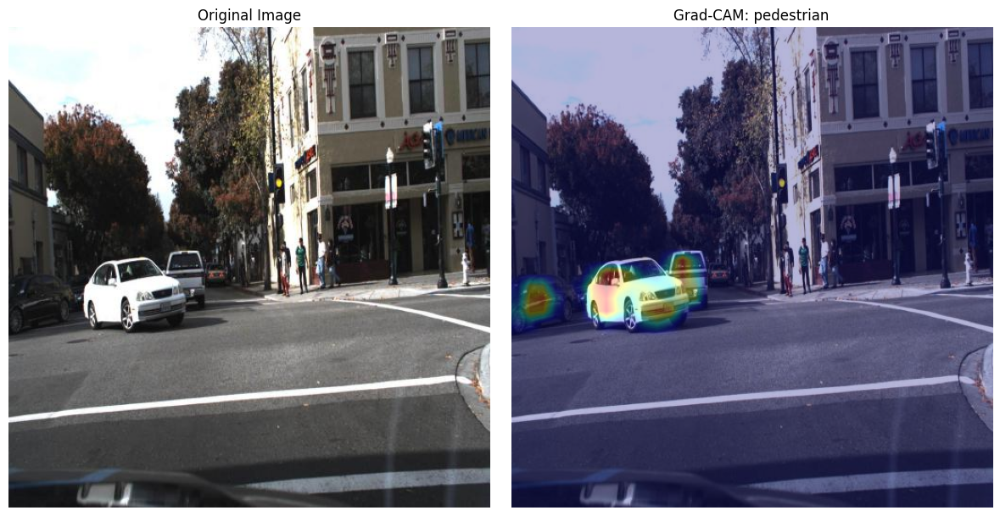

In [121]:
visualize_gradcam(model, test_dataset, [1], category_dict)

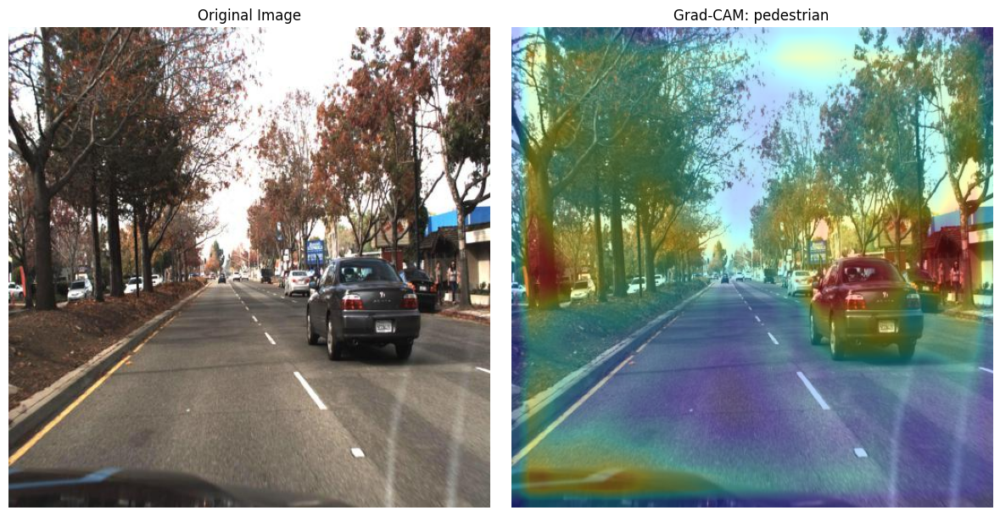

In [125]:
visualize_gradcam(model, test_dataset, [9], category_dict)

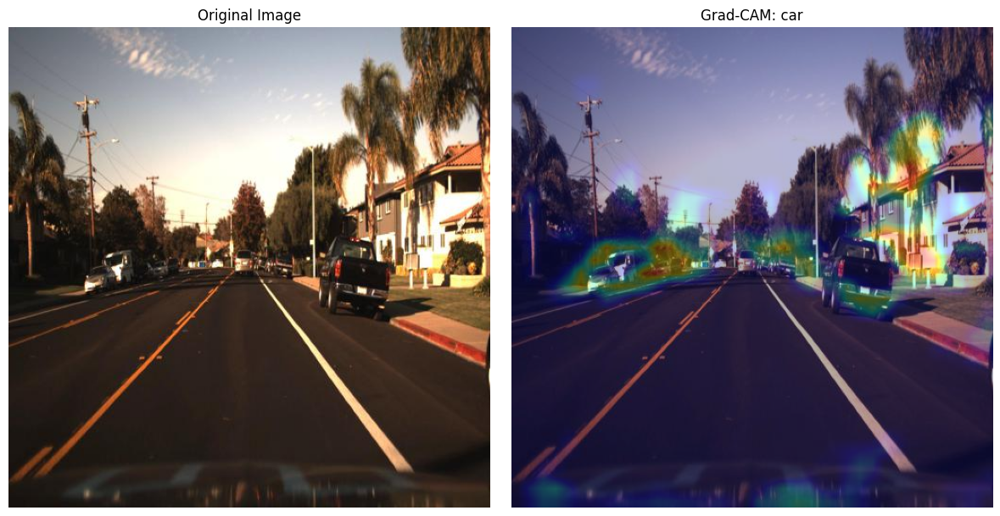

In [126]:
visualize_gradcam(model, test_dataset, [140], category_dict)

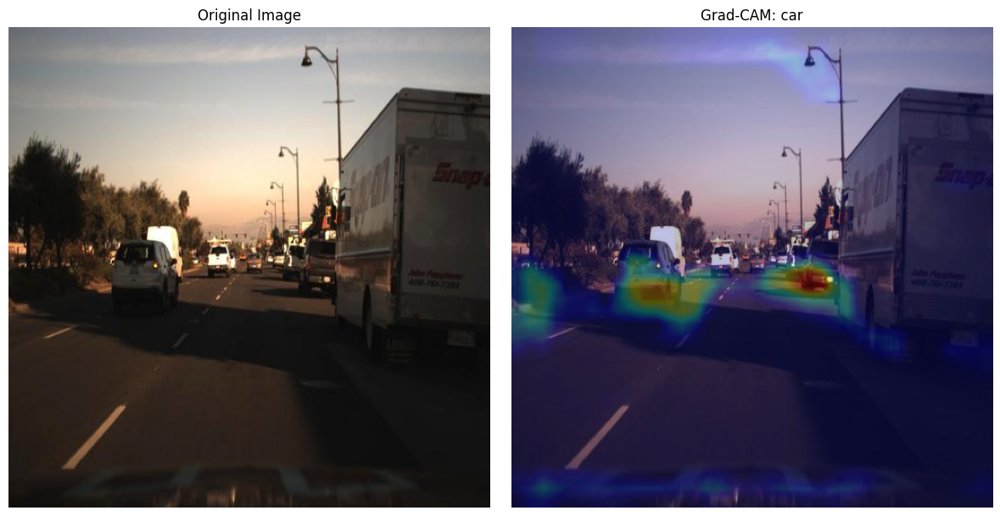

In [128]:
visualize_gradcam(model, test_dataset, [210], category_dict)

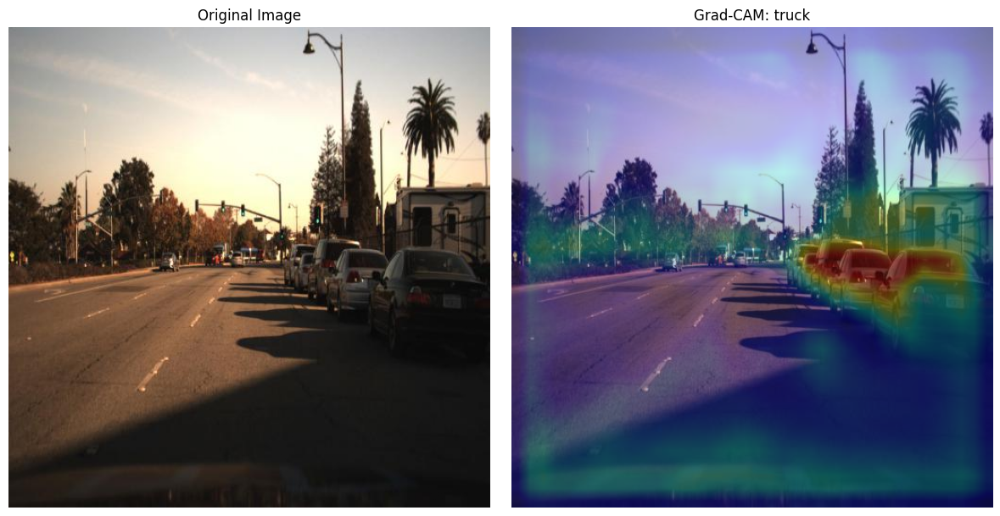

In [133]:
visualize_gradcam(model, test_dataset, [540], category_dict)

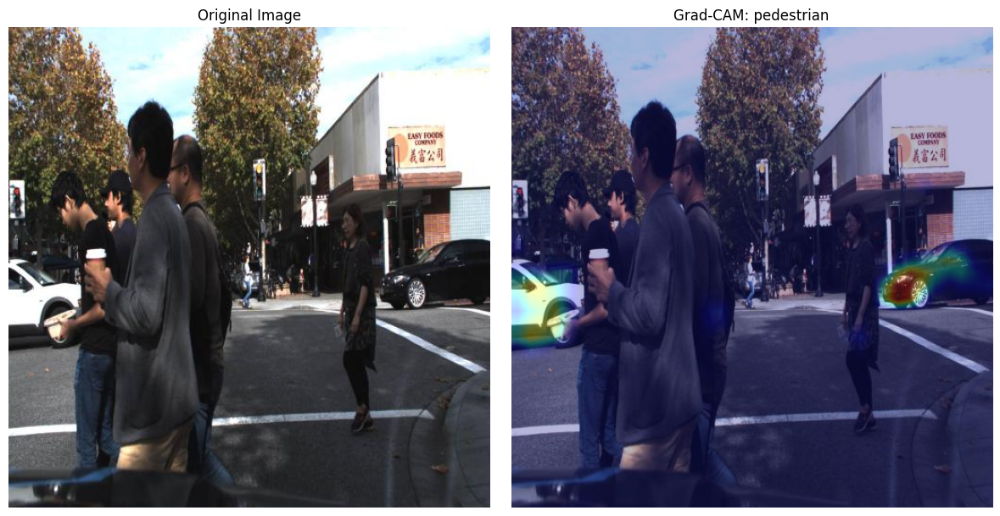

In [150]:
visualize_gradcam(model, test_dataset, [1931], category_dict)

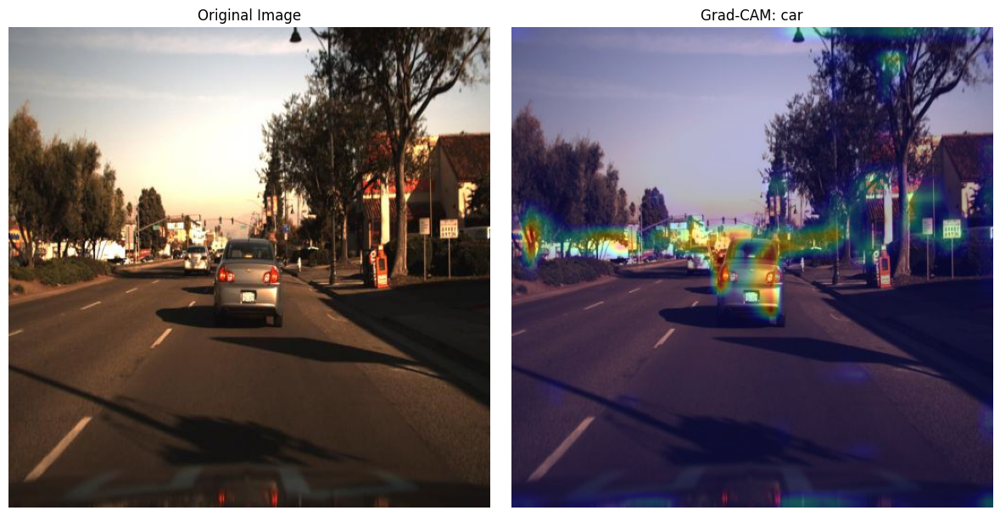

In [180]:
visualize_gradcam(model, test_dataset, [3251], category_dict)

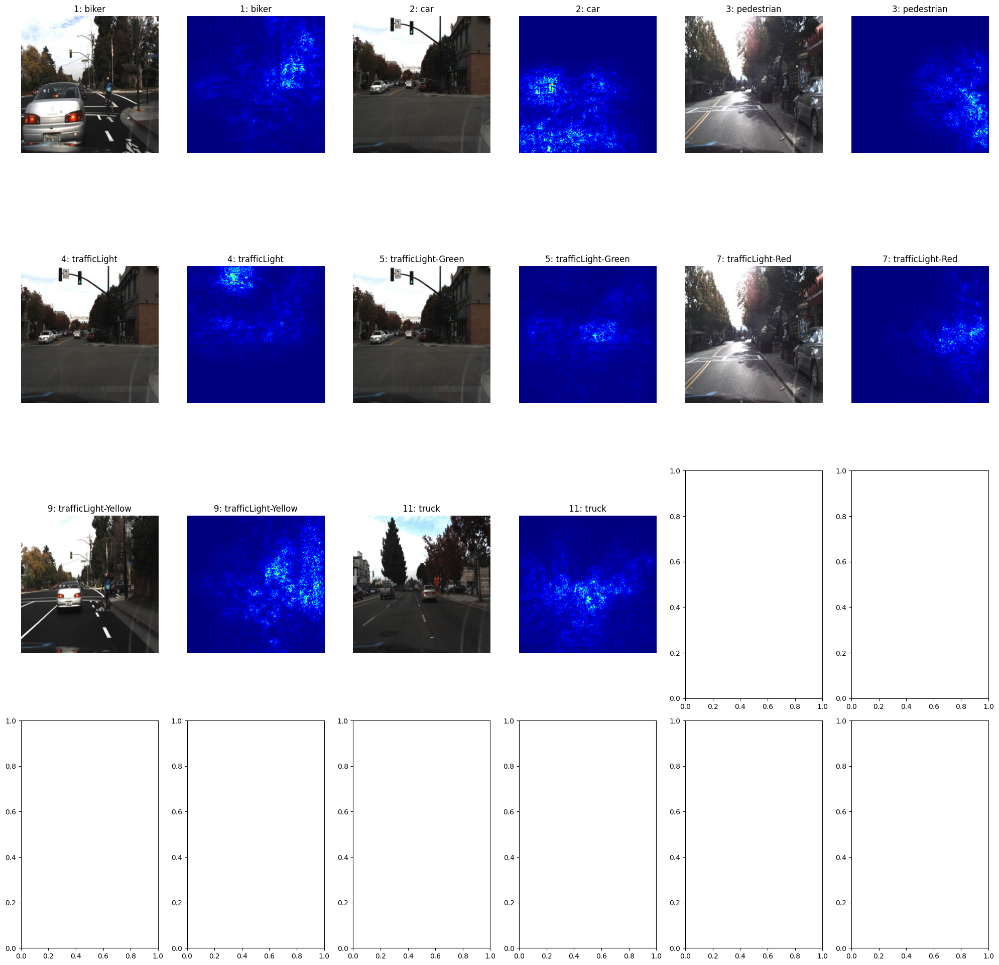

In [181]:
explain_predictions_for_all_targets(model, dataset, sorted_zipped)